In [43]:
%rm -rf sample_data
# %rm -rf *

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Get detectron2 from source

In [4]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Created wheel for detectron2: filename=detectron2-0.6-cp310-cp310-linux_x86_64.whl size=7802943 sha256=832555a59b37059dff5f8fe4f4dec6f86bffd37302285ab1297ce58c7885b870
  Stored in directory: /tmp/pip-ephem-wheel-cache-g_e4p26j/wheels/47/e5/15/94c80df2ba85500c5d76599cc307c0a7079d0e221bb6fc4375
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61429 sha256=5bf669c91b9838f88f49efbc262718390d4fb65f8e6045028356b70926f664aa
  Stored in directory: /root/.cache/pip/wheels/01/c0/af/77c1cf53a1be9e42a52b48e5af2169d40ec2e89f7362489dd0
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=144573 sha256=7166d51e16296cc72e99407dd7dbc226f71d75154db6e7ca62421c31a9f8b6bd
  Stored in directory: /root/.cache/pip/wheels/12/93/dd/1f6a127edc45659556564c5730f6d4e300888f4bca2d4c5a88
Successfully built detectron2 fvcore antlr4-python3-runtime


# Libraries and Modules

In [5]:
# built in modules
import os
import sys
import json
import random

# other required modules
import cv2
import pandas
import requests
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# detectron2
import detectron2
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Dowload one random testing image from internet

In [6]:
img_link = "https://images.unsplash.com/photo-1624555130581-1d9cca783bc0?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1471&q=80"
res = requests.get(img_link)
res

<Response [200]>

In [7]:
# save as 'img.jpg'
with open('img.jpg', 'wb') as f:
  f.write(res.content)

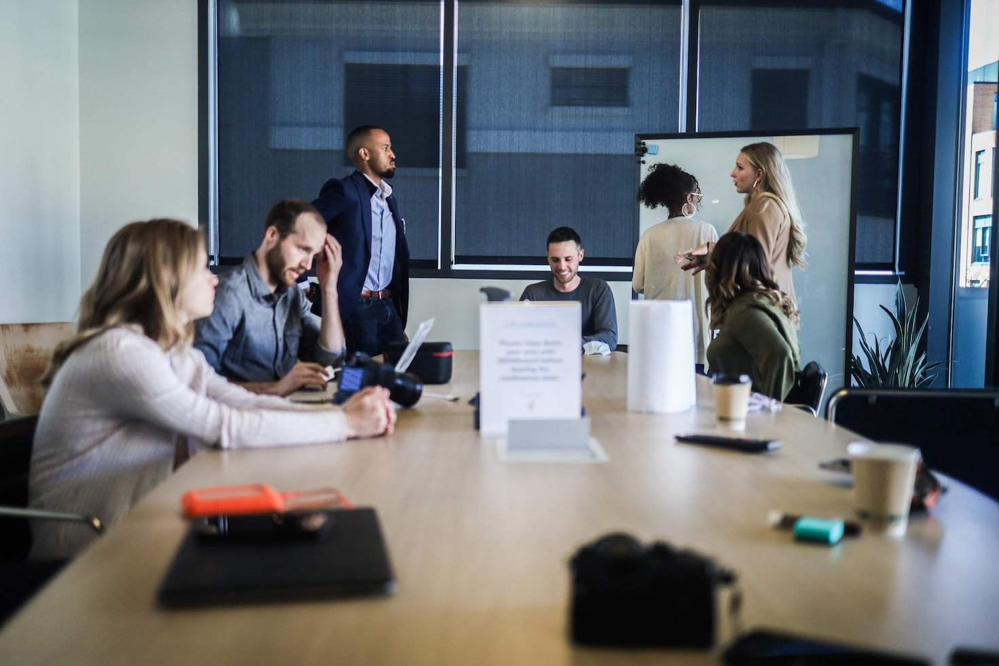

In [8]:
# see the image
img = cv2.imread("img.jpg")
cv2_imshow(img)

# Using pretrained mask-rcnn model

In [ ]:
# config for using pre-trained mask rcnn model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
# model
predictor = DefaultPredictor(cfg)

model_final_f10217.pkl: 178MB [00:00, 187MB/s]                           


In [ ]:
outputs = predictor(img)
outputs

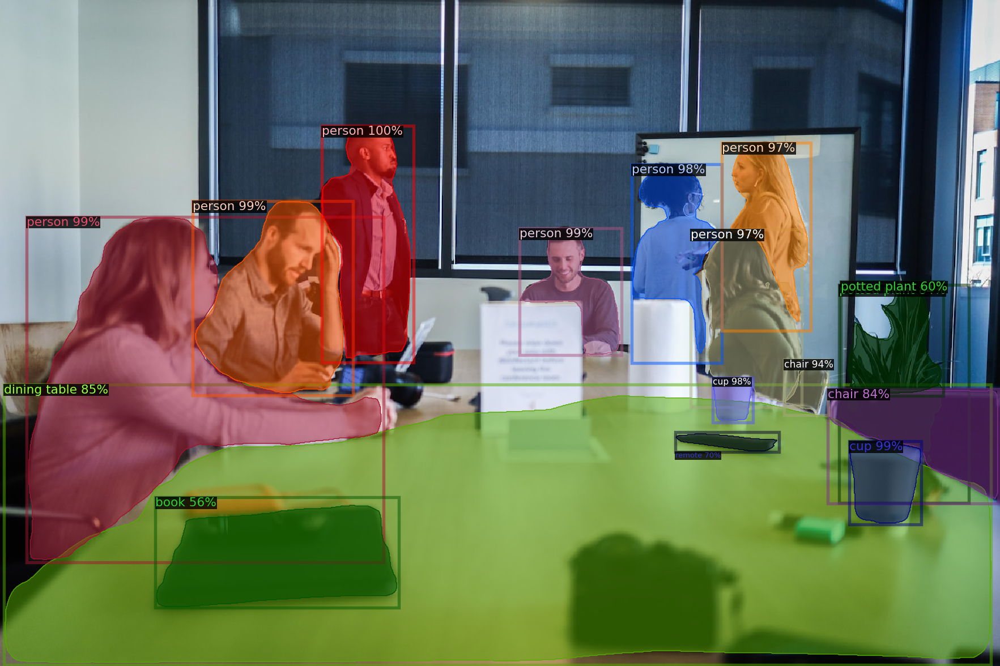

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

# Using pretrained frcnn model

In [ ]:
# config for using pre-trained faster rcnn model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRES_TEST = 0.5 # only 0.5 confidence and above
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
# model
predictor = DefaultPredictor(cfg)

model_final_280758.pkl: 167MB [00:01, 118MB/s]                           


In [ ]:
outputs = predictor(img)
outputs

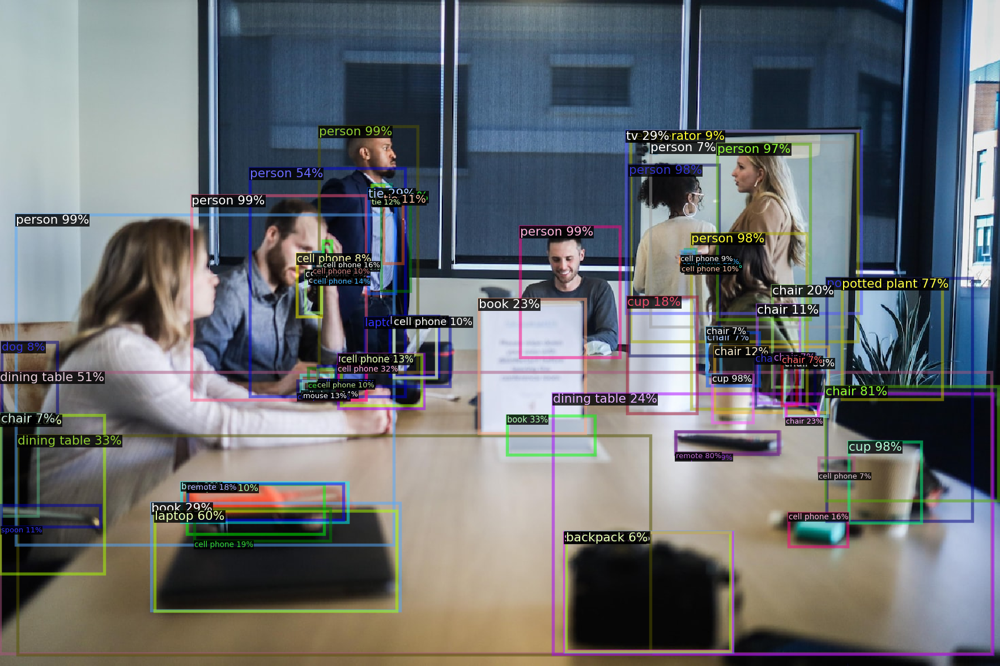

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

# Transfer learning faster-rcnn model

## 1. Dataset

### (i) download


In [9]:
%%bash
pip install gdown
DATA_SET_LINK="https://drive.google.com/file/d/1zfZa3xsK36E0Zr8DD5Kpy9LoIMUftAXr/view?usp=share_link"
gdown --fuzzy $DATA_SET_LINK
unzip -q weapons_dataset_25k.zip
rm weapons_dataset_25k.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Downloading...
From: https://drive.google.com/uc?id=1zfZa3xsK36E0Zr8DD5Kpy9LoIMUftAXr
To: /content/weapons_dataset_25k.zip
100%|██████████| 1.86G/1.86G [00:12<00:00, 149MB/s]


### (ii) Register Dataset

In [10]:
# dtaset are in coco format prepared with roboflow 
# detectron2 has coco format registration for datasets
from detectron2.data.datasets import register_coco_instances

register_coco_instances("dataset_train", {}, "dataset/train/_annotations.coco.json", "dataset/train/")
register_coco_instances("dataset_test", {}, "dataset/test/_annotations.coco.json", "dataset/test/")
register_coco_instances("dataset_valid", {}, "dataset/valid/_annotations.coco.json", "dataset/valid/") # will not be used

### (iii). Check if dataset registered correctly

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



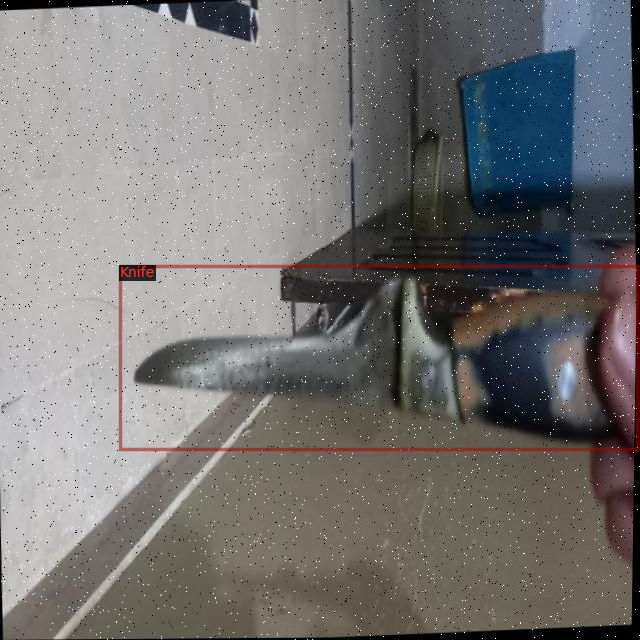

In [11]:
train_metadata = MetadataCatalog.get("dataset_train")
train_dataset_dict = DatasetCatalog.get("dataset_train")

# selects a random image from training set
random_train_data = random.choice(train_dataset_dict)
img = cv2.imread(random_train_data['file_name'])
v = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=1)
out = v.draw_dataset_dict(random_train_data)

cv2_imshow(out.get_image()[:, :, ::-1])

## 2. Training the model

### (i) COCO Trainer

In [12]:
# We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

### (ii) config

In [29]:
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("dataset_train",)
cfg.DATASETS.TEST = ("dataset_test",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.STEPS = []

cfg.SOLVER.MAX_ITER = 4000 # adjust up if val mAP is still rising, adjust down if overfit

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5 # dataset prepared with `roboflow` adds one extra class [ only 4 classes to be detected]

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

### (iii) Train

In [15]:
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/08 11:48:25 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_280758.pkl: 167MB [00:00, 178MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[05/08 11:48:28 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/08 11:48:44 d2.utils.events]:  eta: 0:40:16  iter: 19  total_loss: 2.398  loss_cls: 1.967  loss_box_reg: 0.4137  loss_rpn_cls: 0.01913  loss_rpn_loc: 0.01207    time: 0.5989  last_time: 0.5650  data_time: 0.0409  last_data_time: 0.0261   lr: 4.9953e-06  max_mem: 3062M
[05/08 11:48:58 d2.utils.events]:  eta: 0:40:03  iter: 39  total_loss: 2.245  loss_cls: 1.792  loss_box_reg: 0.3691  loss_rpn_cls: 0.02494  loss_rpn_loc: 0.01252    time: 0.5954  last_time: 0.5479  data_time: 0.0261  last_data_time: 0.0294   lr: 9.9902e-06  max_mem: 3062M
[05/08 11:49:10 d2.utils.events]:  eta: 0:38:53  iter: 59  total_loss: 1.923  loss_cls: 1.507  loss_box_reg: 0.4248  loss_rpn_cls: 0.0181  loss_rpn_loc: 0.01288    time: 0.5916  last_time: 0.5662  data_time: 0.0213  last_data_time: 0.0201   lr: 1.4985e-05  max_mem: 3062M
[05/08 11:49:22 d2.utils.events]:  eta: 0:39:39  iter: 79  total_loss: 1.458  loss_cls: 1.061  loss_box_reg: 0.3668  loss_rpn_cls: 0.02404  loss_rpn_loc: 0.01204    time: 0.5975  las

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/08 12:32:41 d2.evaluation.evaluator]: Inference done 11/766. Dataloading: 0.0010 s/iter. Inference: 0.0816 s/iter. Eval: 0.0003 s/iter. Total: 0.0829 s/iter. ETA=0:01:02
[05/08 12:32:46 d2.evaluation.evaluator]: Inference done 71/766. Dataloading: 0.0016 s/iter. Inference: 0.0817 s/iter. Eval: 0.0003 s/iter. Total: 0.0837 s/iter. ETA=0:00:58
[05/08 12:32:51 d2.evaluation.evaluator]: Inference done 126/766. Dataloading: 0.0034 s/iter. Inference: 0.0835 s/iter. Eval: 0.0004 s/iter. Total: 0.0873 s/iter. ETA=0:00:55
[05/08 12:32:56 d2.evaluation.evaluator]: Inference done 186/766. Dataloading: 0.0031 s/iter. Inference: 0.0828 s/iter. Eval: 0.0003 s/iter. Total: 0.0863 s/iter. ETA=0:00:50
[05/08 12:33:02 d2.evaluation.evaluator]: Inference done 246/766. Dataloading: 0.0029 s/iter. Inference: 0.0825 s/iter. Eval: 0.0003 s/iter. Total: 0.0858 s/iter. ETA=0:00:44
[05/08 12:33:07 d2.evaluation.evaluator]: Inference done 301/766. Dataloading: 0.0036 s/iter. Inference: 0.0829 s/iter. Eval: 0

### (iv) Save the output in drive

In [40]:
!cp -r ./output /content/drive/MyDrive

### (iv) Training result

In [42]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## 3. Testing and Evaluation

### (i) Inferencing on some of test images

In [44]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[05/08 13:08:12 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


WARNING [05/08 13:09:57 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/08 13:09:57 d2.data.datasets.coco]: Loaded 766 images in COCO format from dataset/test/_annotations.coco.json


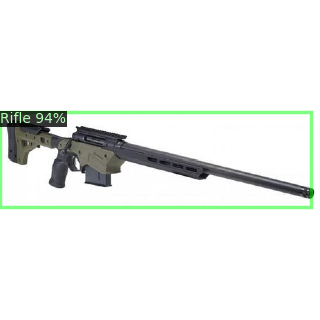

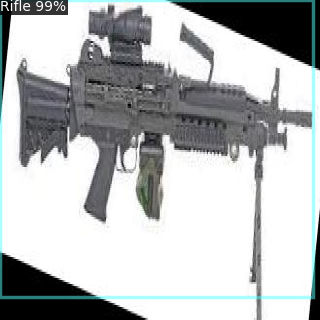

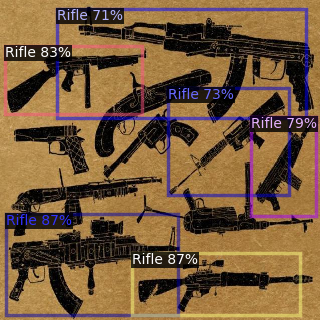

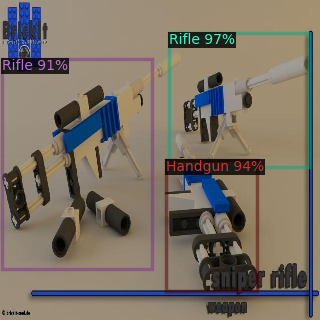

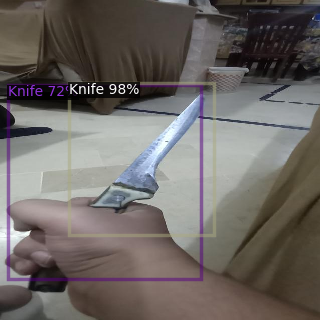

In [46]:
# TEST DATASET METADATA
test_metadata = MetadataCatalog.get("dataset_test")
test_dataset_dict = DatasetCatalog.get("dataset_test")

# testing_images
testing_images = random.sample(test_dataset_dict, 5)

for i in testing_images:
  img = cv2.imread(i['file_name'])
  outputs = predictor(img)

  v = Visualizer(img[:, :, ::-1], test_metadata, scale=0.5)
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])

### (ii) Model Evaluation in test dataset

In [34]:
# test evaluation
from detectron2.data import build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[05/08 12:48:16 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
WARNING [05/08 12:48:16 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [05/08 12:48:16 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/08 12:48:16 d2.data.datasets.coco]: Loaded 766 images in COCO format from dataset/test/_annotations.coco.json
[05/08 12:48:16 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/08 12:48:16 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/08 12:48:16 d2.data.common]: Serializing 766 elements to byte tensors and concatenating them all ...
[05/08 12:48:16 d2.data.common]: Serialized dataset takes

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/08 12:48:18 d2.evaluation.evaluator]: Inference done 11/766. Dataloading: 0.0014 s/iter. Inference: 0.0829 s/iter. Eval: 0.0003 s/iter. Total: 0.0846 s/iter. ETA=0:01:03
[05/08 12:48:23 d2.evaluation.evaluator]: Inference done 64/766. Dataloading: 0.0051 s/iter. Inference: 0.0881 s/iter. Eval: 0.0003 s/iter. Total: 0.0937 s/iter. ETA=0:01:05
[05/08 12:48:28 d2.evaluation.evaluator]: Inference done 115/766. Dataloading: 0.0052 s/iter. Inference: 0.0902 s/iter. Eval: 0.0003 s/iter. Total: 0.0960 s/iter. ETA=0:01:02
[05/08 12:48:33 d2.evaluation.evaluator]: Inference done 171/766. Dataloading: 0.0043 s/iter. Inference: 0.0890 s/iter. Eval: 0.0003 s/iter. Total: 0.0938 s/iter. ETA=0:00:55
[05/08 12:48:38 d2.evaluation.evaluator]: Inference done 225/766. Dataloading: 0.0044 s/iter. Inference: 0.0888 s/iter. Eval: 0.0003 s/iter. Total: 0.0938 s/iter. ETA=0:00:50
[05/08 12:48:43 d2.evaluation.evaluator]: Inference done 281/766. Dataloading: 0.0044 s/iter. Inference: 0.0881 s/iter. Eval: 0

OrderedDict([('bbox',
              {'AP': 43.67197955596089,
               'AP50': 77.46551307761331,
               'AP75': 43.680414835397706,
               'APs': 3.3229166666666665,
               'APm': 22.419341021607394,
               'APl': 46.20288058558943,
               'AP-weapons': nan,
               'AP-Handgun': 55.7526936773011,
               'AP-Knife': 36.24933079758395,
               'AP-Rifle': 30.830939316723217,
               'AP-Sword': 51.85495443223531})])